<a href="https://colab.research.google.com/github/swetha343452-code/MACHINE-LEARNING/blob/main/Location_based_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from IPython.display import display

In [2]:
df=pd.read_csv('/content/Dataset .csv')

In [3]:
print(df[['Latitude','Longitude']].head())

    Latitude   Longitude
0  14.565443  121.027535
1  14.553708  121.014101
2  14.581404  121.056831
3  14.585318  121.056475
4  14.584450  121.057508


In [4]:
print(df[['Latitude','Longitude']].isnull().sum())

Latitude     0
Longitude    0
dtype: int64


In [5]:
df=df.dropna(subset=['Latitude','Longitude'])

In [6]:
restaurant_map=folium.Map(location=[df['Latitude'].mean(),
                                    df['Longitude'].mean()],zoom_start=5)

In [7]:
for _,row in df.iterrows():
  folium.CircleMarker(location=[row['Latitude'],row['Longitude']],
                      radius=2,
                      color='red',
                      fill=True,
                      fill_color='red',
                      fill_opacity=0.7).add_to(restaurant_map)

In [8]:
rating_by_city = df.groupby("City")["Aggregate rating"].mean().reset_index()

print(rating_by_city)

rating_by_city.sort_values("Aggregate rating", ascending=False).head(10)

                City  Aggregate rating
0          Abu Dhabi          4.300000
1               Agra          3.965000
2          Ahmedabad          4.161905
3             Albany          3.555000
4          Allahabad          3.395000
..               ...               ...
136          Weirton          3.900000
137  Wellington City          4.250000
138   Winchester Bay          3.200000
139          Yorkton          3.300000
140        ��stanbul          4.292857

[141 rows x 2 columns]


,City,Aggregate rating
56,Inner City,4.900000
107,Quezon City,4.800000
73,Makati City,4.650000
95,Pasig City,4.633333
75,Mandaluyong City,4.625000
15,Beechworth,4.600000
67,London,4.535000
123,Taguig City,4.525000
116,Secunderabad,4.500000
66,Lincoln,4.500000


In [9]:
cost_by_city = df.groupby("City")["Average Cost for two"].mean().reset_index()

print(cost_by_city)

cost_by_city.sort_values("Average Cost for two", ascending=False).head(10)

                City  Average Cost for two
0          Abu Dhabi            182.000000
1               Agra           1065.000000
2          Ahmedabad            857.142857
3             Albany             19.750000
4          Allahabad            517.500000
..               ...                   ...
136          Weirton             25.000000
137  Wellington City             71.250000
138   Winchester Bay             25.000000
139          Yorkton             25.000000
140        ��stanbul             81.428571

[141 rows x 2 columns]


,City,Average Cost for two
59,Jakarta,308437.500000
125,Tangerang,250000.000000
19,Bogor,160000.000000
13,Bandung,150000.000000
94,Pasay City,3333.333333
30,Colombo,2375.000000
75,Mandaluyong City,2000.000000
93,Panchkula,2000.000000
123,Taguig City,1725.000000
54,Hyderabad,1361.111111


In [14]:
popular_cuisine = df.groupby("City")["Cuisines"].agg(lambda x: x.mode().get(0)).reset_index()

print(popular_cuisine)

                City                                          Cuisines
0          Abu Dhabi                                          American
1               Agra                             North Indian, Mughlai
2          Ahmedabad  Cafe, American, Continental, Armenian, Fast Food
3             Albany                            Japanese, Steak, Sushi
4          Allahabad                             North Indian, Chinese
..               ...                                               ...
136          Weirton                           Burger, Greek, Sandwich
137  Wellington City                                              Cafe
138   Winchester Bay                            Burger, Seafood, Steak
139          Yorkton                                             Asian
140        ��stanbul                                              Cafe

[141 rows x 2 columns]


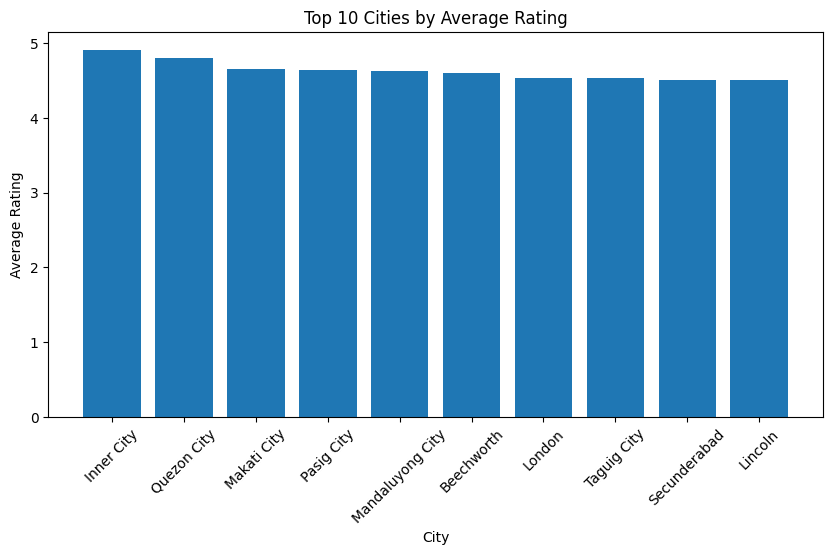

In [11]:
import matplotlib.pyplot as plt

top_rating = rating_by_city.sort_values("Aggregate rating", ascending=False).head(10)

plt.figure(figsize=(10,5))
plt.bar(top_rating["City"], top_rating["Aggregate rating"])
plt.title("Top 10 Cities by Average Rating")
plt.xlabel("City")
plt.ylabel("Average Rating")
plt.xticks(rotation=45)
plt.show()

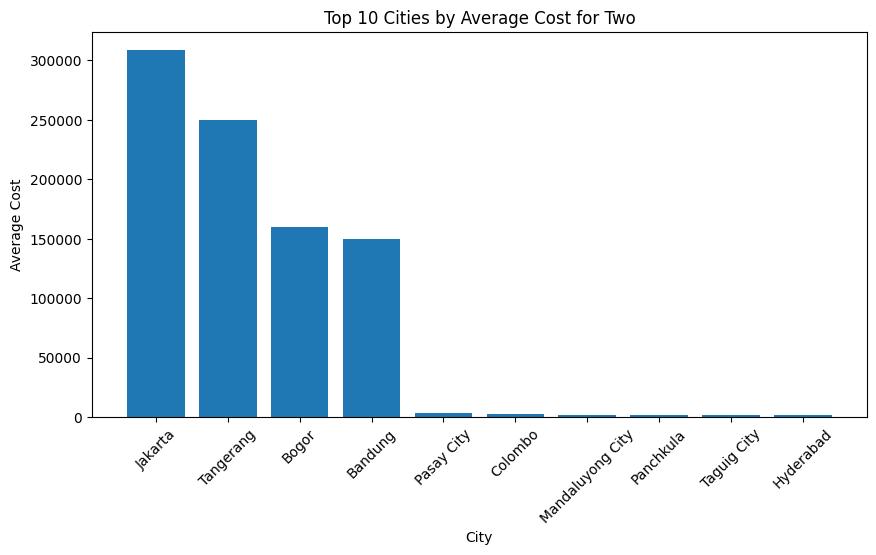

In [12]:
top_cost = cost_by_city.sort_values("Average Cost for two", ascending=False).head(10)

plt.figure(figsize=(10,5))
plt.bar(top_cost["City"], top_cost["Average Cost for two"])
plt.title("Top 10 Cities by Average Cost for Two")
plt.xlabel("City")
plt.ylabel("Average Cost")
plt.xticks(rotation=45)
plt.show()

In [16]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

df = pd.read_csv("/content/Dataset .csv")

df = df.dropna(subset=["Latitude", "Longitude"])

restaurant_map = folium.Map(
    location=[df["Latitude"].mean(), df["Longitude"].mean()],
    zoom_start=5
)

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=row["Restaurant Name"]
    ).add_to(marker_cluster)


restaurant_map

In [17]:
restaurant_map.save("restaurant_map.html")

In [18]:
from google.colab import files
files.download("restaurant_map.html")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>